<a href="https://colab.research.google.com/github/CameronRabsatt/DataMining-Project/blob/main/Copy_of_final_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Mining Final Project

This notebook follows the CRISP-DM process. Cameron Rabsatt 2025


In [1]:
# Import necessary libraries
# Basic libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# AutoViz
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class

# PyCaret
!pip install pycaret
from pycaret.classification import *

# Warnings
import warnings
warnings.filterwarnings('ignore')

# Metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score #metrics


Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)


## Step 1: Business and Data Understanding

In [2]:
#Load your dataset
df = pd.read_csv('https://raw.githubusercontent.com/CameronRabsatt/DataMining-Project/refs/heads/main/data/NBA_GAMES_1950_2022_.csv')
df.head()

,Team_ID,Game_ID,GAME_DATE,MATCHUP,WL,W,L,W_PCT,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,SEASON_ID,TEAM_NAME,TEAM_ABBREVIATION
0,1610612737,28000934,1981-03-29,ATL vs. MIL,L,NaN,NaN,NaN,265,41.0,NaN,NaN,0.0,NaN,NaN,46.0,52.0,0.885,NaN,NaN,0,NaN,NaN,NaN,NaN,35.0,128,NaN,Atlanta Hawks,ATL
1,1610612737,28000921,1981-03-27,ATL @ CHI,L,NaN,NaN,NaN,240,40.0,NaN,NaN,0.0,NaN,NaN,3.0,9.0,0.333,NaN,NaN,0,NaN,NaN,NaN,NaN,24.0,83,NaN,Atlanta Hawks,ATL
2,1610612737,28000919,1981-03-26,ATL vs. IND,L,NaN,NaN,NaN,240,43.0,NaN,NaN,1.0,NaN,NaN,20.0,24.0,0.833,NaN,NaN,0,NaN,NaN,NaN,NaN,26.0,107,NaN,Atlanta Hawks,ATL
3,1610612737,28000908,1981-03-24,ATL vs. DET,W,NaN,NaN,NaN,240,41.0,NaN,NaN,0.0,NaN,NaN,14.0,22.0,0.636,NaN,NaN,0,NaN,NaN,NaN,NaN,23.0,96,NaN,Atlanta Hawks,ATL
4,1610612737,28000895,1981-03-22,ATL @ WAS,L,NaN,NaN,NaN,240,40.0,NaN,NaN,0.0,NaN,NaN,21.0,32.0,0.656,NaN,NaN,0,NaN,NaN,NaN,NaN,27.0,101,NaN,Atlanta Hawks,ATL


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121397 entries, 0 to 121396
Data columns (total 30 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Team_ID            121397 non-null  int64  
 1   Game_ID            121397 non-null  int64  
 2   GAME_DATE          121397 non-null  object 
 3   MATCHUP            121397 non-null  object 
 4   WL                 121395 non-null  object 
 5   W                  46868 non-null   float64
 6   L                  46868 non-null   float64
 7   W_PCT              46868 non-null   float64
 8   MIN                121397 non-null  int64  
 9   FGM                121383 non-null  float64
 10  FGA                90774 non-null   float64
 11  FG_PCT             90755 non-null   float64
 12  FG3M               93490 non-null   float64
 13  FG3A               84766 non-null   float64
 14  FG3_PCT            81140 non-null   float64
 15  FTM                121381 non-null  float64
 16  FT

In [4]:
dfClean = df.drop('SEASON_ID' , axis = 1)
dfClean = dfClean.drop(columns = ['W' , 'L' , 'W_PCT'])
dfClean = dfClean.dropna()
dfClean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 80616 entries, 2152 to 93443
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Team_ID            80616 non-null  int64  
 1   Game_ID            80616 non-null  int64  
 2   GAME_DATE          80616 non-null  object 
 3   MATCHUP            80616 non-null  object 
 4   WL                 80616 non-null  object 
 5   MIN                80616 non-null  int64  
 6   FGM                80616 non-null  float64
 7   FGA                80616 non-null  float64
 8   FG_PCT             80616 non-null  float64
 9   FG3M               80616 non-null  float64
 10  FG3A               80616 non-null  float64
 11  FG3_PCT            80616 non-null  float64
 12  FTM                80616 non-null  float64
 13  FTA                80616 non-null  float64
 14  FT_PCT             80616 non-null  float64
 15  OREB               80616 non-null  float64
 16  DREB               80616

In [5]:
dfClean.head()

,Team_ID,Game_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,TEAM_NAME,TEAM_ABBREVIATION
2152,1610612741,28100706,1982-03-10,CHI @ MIL,W,240,40.0,76.0,0.526,0.0,0.0,0.000,21.0,23.0,0.913,15.0,29.0,44,21.0,4.0,2.0,23.0,26.0,101,Chicago Bulls,CHI
2164,1610612741,28100564,1982-02-13,CHI vs. MIL,L,240,33.0,93.0,0.355,3.0,10.0,0.300,21.0,29.0,0.724,30.0,18.0,48,24.0,7.0,4.0,20.0,18.0,90,Chicago Bulls,CHI
2200,1610612741,28100136,1981-11-24,CHI @ SDC,W,240,38.0,75.0,0.507,0.0,0.0,0.000,33.0,37.0,0.892,8.0,30.0,38,19.0,8.0,6.0,20.0,30.0,109,Chicago Bulls,CHI
2251,1610612742,28100518,1982-02-05,DAL @ MIL,L,240,32.0,69.0,0.464,1.0,3.0,0.333,27.0,40.0,0.675,8.0,19.0,27,21.0,5.0,1.0,21.0,27.0,92,Dallas Mavericks,DAL
2480,1610612745,28100701,1982-03-09,HOU vs. MIL,W,240,42.0,91.0,0.462,0.0,0.0,0.000,19.0,28.0,0.679,22.0,30.0,52,20.0,7.0,2.0,14.0,19.0,103,Houston Rockets,HOU


In [6]:
dfClean.describe()

,Team_ID,Game_ID,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS
count,8.061600e+04,8.061600e+04,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.00000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000,80616.000000
mean,1.610613e+09,2.373161e+07,241.742222,38.290972,83.462749,0.459651,6.483638,18.280676,0.344477,18.843021,24.913541,0.756665,11.82114,30.835169,42.656309,22.797757,7.885494,4.983378,14.338791,21.529374,101.908604
std,8.563619e+00,3.862735e+06,7.402746,5.670971,8.348317,0.057499,4.262954,10.085404,0.141799,6.492506,8.023206,0.100503,4.32430,5.605824,6.733784,5.438083,3.039646,2.645476,4.091045,4.655509,13.434881
min,1.610613e+09,2.000000e+07,216.000000,16.000000,53.000000,0.234000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.00000,8.000000,17.000000,4.000000,0.000000,0.000000,1.000000,5.000000,49.000000
25%,1.610613e+09,2.080040e+07,240.000000,34.000000,78.000000,0.420000,3.000000,11.000000,0.263000,14.000000,19.000000,0.692000,9.00000,27.000000,38.000000,19.000000,6.000000,3.000000,11.000000,18.000000,93.000000
50%,1.610613e+09,2.160088e+07,240.000000,38.000000,83.000000,0.458000,6.000000,17.000000,0.346000,18.000000,24.000000,0.762000,11.00000,31.000000,42.000000,23.000000,8.000000,5.000000,14.000000,21.000000,101.000000
75%,1.610613e+09,2.890086e+07,240.000000,42.000000,89.000000,0.500000,9.000000,24.000000,0.429000,23.000000,30.000000,0.826000,14.00000,35.000000,47.000000,26.000000,10.000000,7.000000,17.000000,25.000000,111.000000
max,1.610613e+09,2.980072e+07,365.000000,68.000000,130.000000,0.977000,29.000000,70.000000,1.000000,61.000000,80.000000,1.000000,38.00000,60.000000,81.000000,52.000000,27.000000,23.000000,40.000000,52.000000,173.000000


Shape of your Data Set loaded: (80616, 26)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  16
    Number of Integer-Categorical Columns =  5
    Number of String-Categorical Columns =  2
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  1
    Number of Numeric-Boolean Columns =  0
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  2
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    26 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All varia

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Team_ID,int64,0.000000,0,1610612737.000000,1610612766.000000,No issue
Game_ID,int64,0.000000,50,20000001.000000,29800725.000000,No issue
GAME_DATE,object,0.000000,7,,,No issue
MATCHUP,object,0.000000,3,,,No issue
WL,object,0.000000,0,,,No issue
MIN,int64,0.000000,0,216.000000,365.000000,Column has 4832 outliers greater than upper bound (240.00) or lower than lower bound(240.00). Cap them or remove them.
FGM,float64,0.000000,NA,16.000000,68.000000,Column has 418 outliers greater than upper bound (54.00) or lower than lower bound(22.00). Cap them or remove them.
FGA,float64,0.000000,NA,53.000000,130.000000,Column has 828 outliers greater than upper bound (105.50) or lower than lower bound(61.50). Cap them or remove them.
FG_PCT,float64,0.000000,NA,0.234000,0.977000,Column has 433 outliers greater than upper bound (0.62) or lower than lower bound(0.30). Cap them or remove them.
FG3M,float64,0.000000,NA,0.000000,29.000000,Column has 784 outliers greater than upper bound (18.00) or lower than lower bound(-6.00). Cap them or remove them.


Number of All Scatter Plots = 136


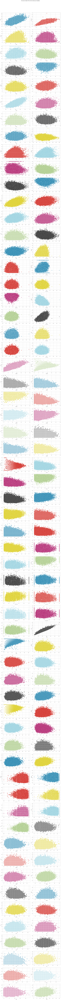

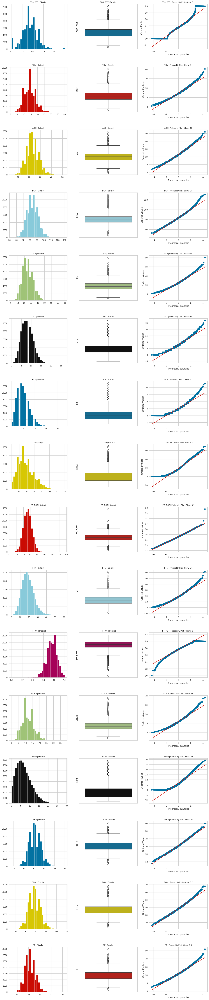

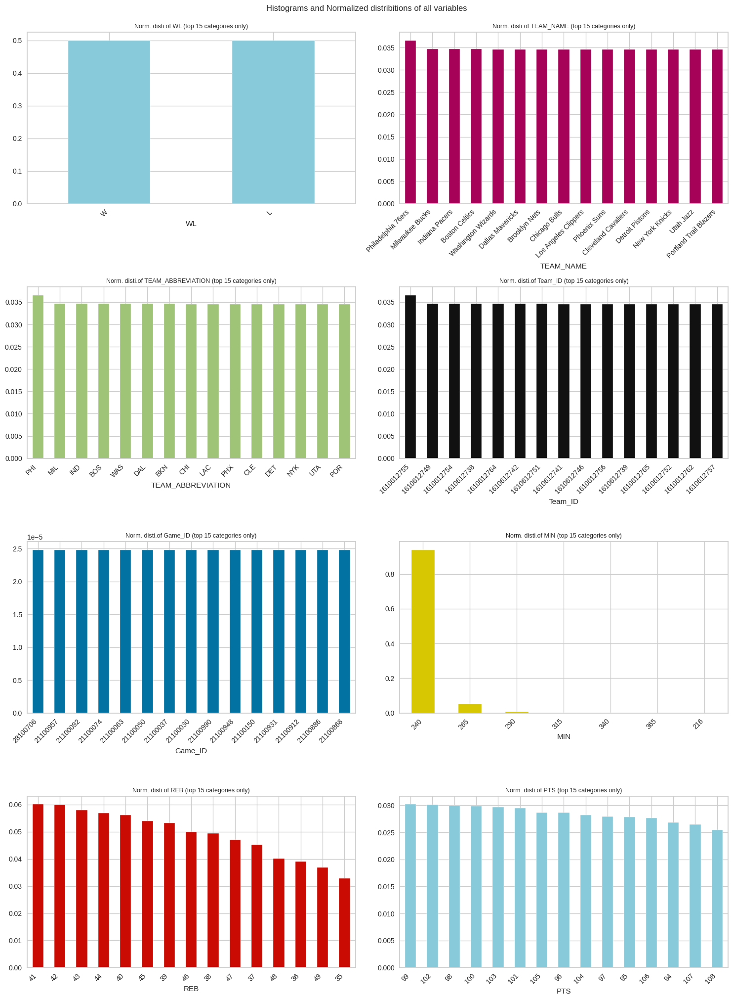

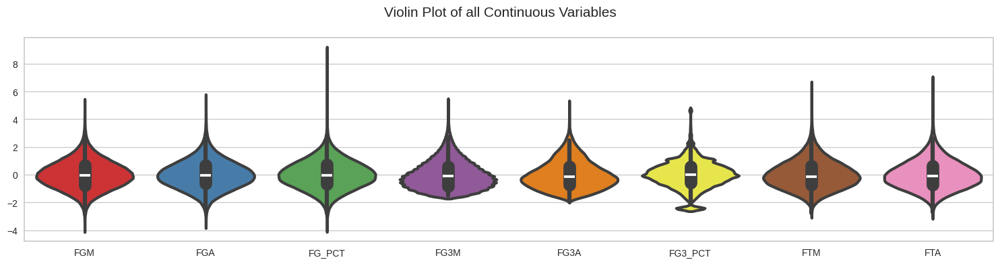

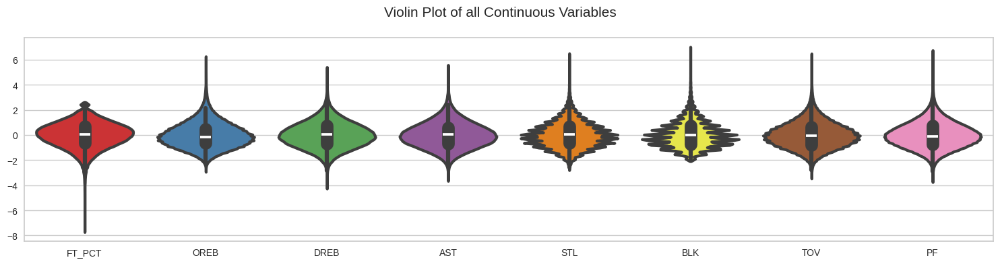

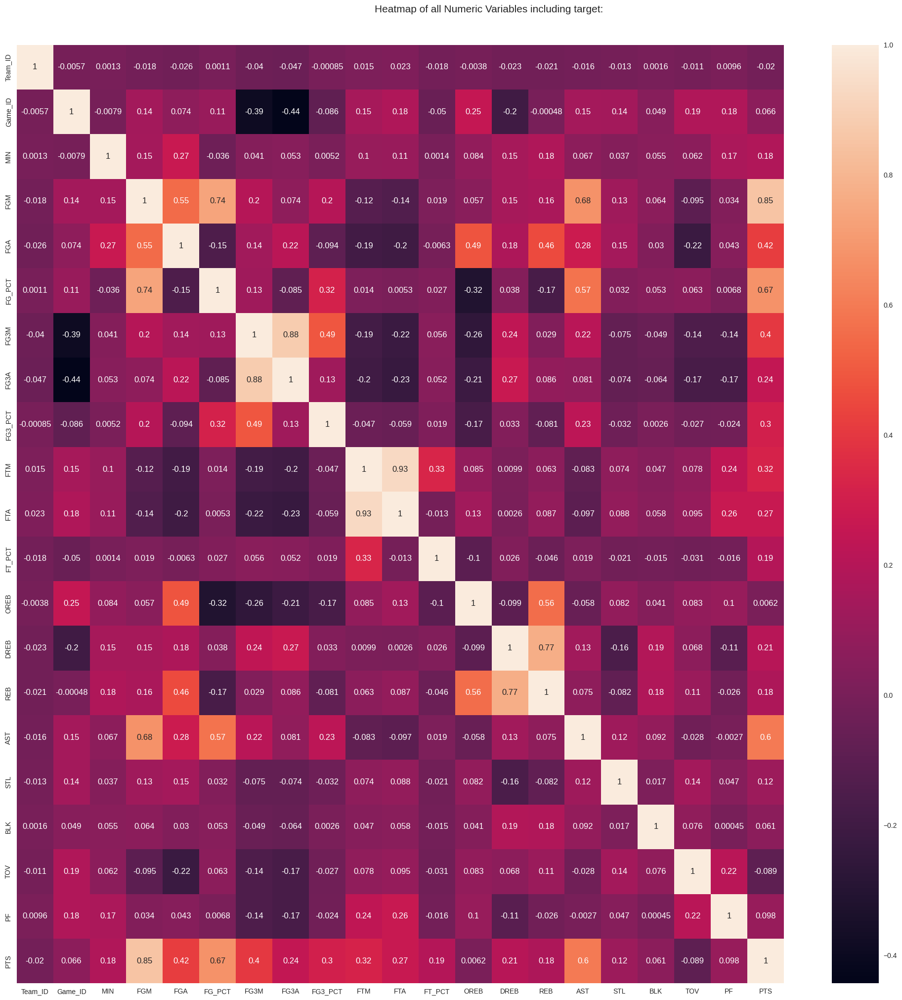

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

Could not draw wordcloud plot for GAME_DATE. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

Could not draw wordcloud plot for MATCHUP. 
Looks like you are missing some required data for this feature.

To download the necessary data, simply run

    python -m textblob.download_corpora

or use the NLTK downloader to download the missing data: http://nltk.org/data.html
If this doesn't fix the problem, file an issue at https://github.com/sloria/TextBlob/issues.

All Plots done
Time to run AutoViz = 136 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


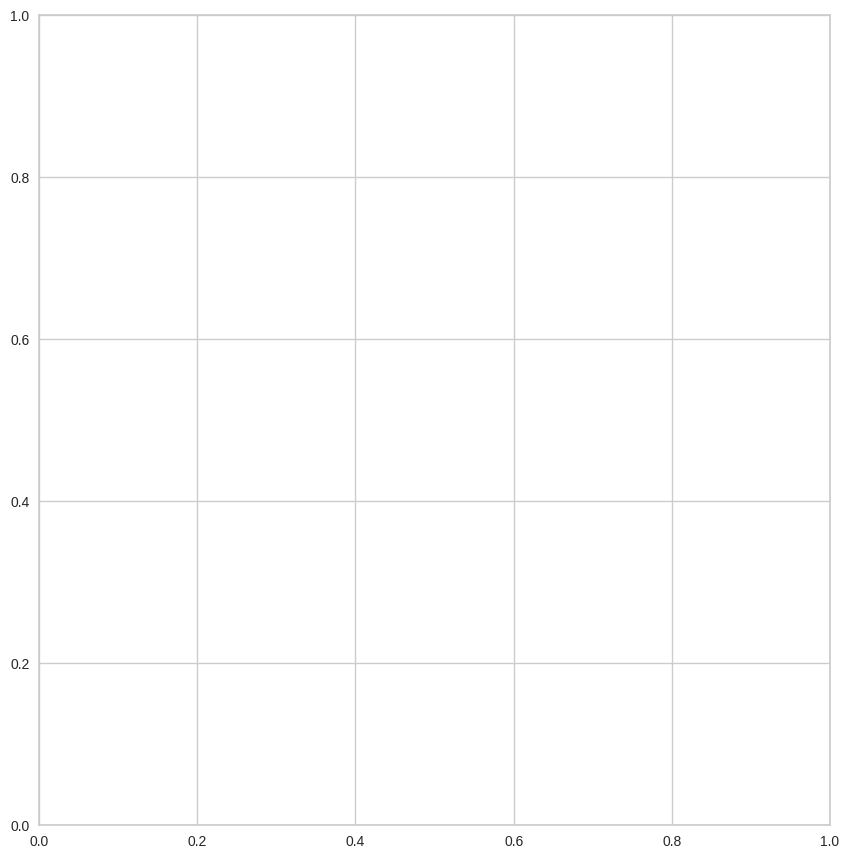

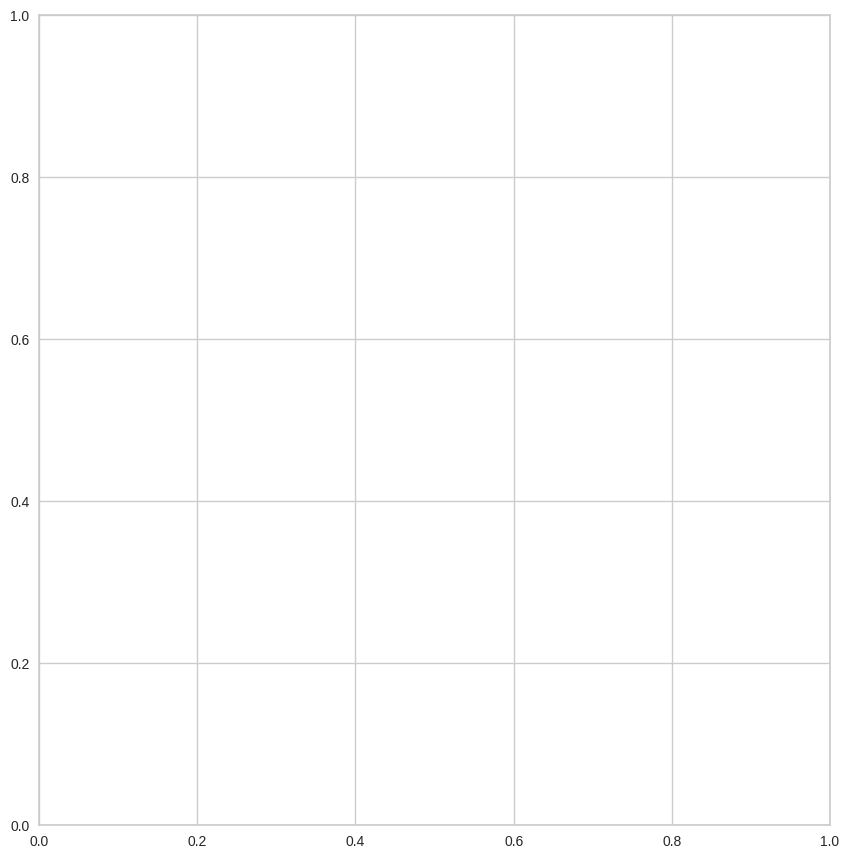

In [8]:

AV = AutoViz_Class()
auto_viz = AV.AutoViz(dfClean)

In [ ]:
# Setup PyCaret
clf1 = setup(data=dfClean, target='WL', session_id=123)

# Compare models
compare_models()

,Description,Value
0,Session id,123
1,Target,WL
2,Target type,Binary
3,Target mapping,"L: 0, W: 1"
4,Original data shape,"(80616, 26)"
5,Transformed data shape,"(80616, 26)"
6,Transformed train set shape,"(56431, 26)"
7,Transformed test set shape,"(24185, 26)"
8,Numeric features,21
9,Categorical features,4


,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,18:23:52
Status,. . . . . . . . . . . . . . . . . .,Fitting 10 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Ridge Classifier


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
dt,Decision Tree Classifier,0.7113,0.7113,0.7113,0.7114,0.7113,0.4227,0.4227,1.4370
nb,Naive Bayes,0.6832,0.7620,0.6832,0.6858,0.6821,0.3663,0.3690,0.6290
lr,Logistic Regression,0.5793,0.6105,0.5793,0.5789,0.5698,0.1586,0.1583,1.5690
knn,K Neighbors Classifier,0.5723,0.5947,0.5723,0.5724,0.5723,0.1447,0.1447,4.6430
svm,SVM - Linear Kernel,0.5000,0.4966,0.5000,0.2500,0.3333,0.0000,0.0000,6.0890


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
# Create and evaluate a Random Forest model
rf_model = create_model('rf')
evaluate_model(rf_model)
predict_model(rf_model)